In [2]:
# phase1_model_training.ipynb

import os
import numpy as np
import matplotlib.pyplot as plt

# Set project directories
BASE_DIR = os.path.abspath("..")
DATA_DIR = os.path.join(BASE_DIR, "data", "raw_images")
MODEL_DIR = os.path.join(BASE_DIR, "models")
OUTPUT_DIR = os.path.join(BASE_DIR, "outputs")

# Quick check
print("Data Folder Exists:", os.path.exists(DATA_DIR))

Data Folder Exists: True


In [3]:
import cv2
from glob import glob
from IPython.display import display
from PIL import Image

# Constants
IMAGE_SIZE = (256, 256)  # You can upscale later
IMAGE_FOLDER = DATA_DIR

# Step 1: Load Images in Time Series Order
def load_images(folder_path):
    image_paths = sorted(glob(os.path.join(folder_path, "*.png")))
    images = []
    years = []
    
    for path in image_paths:
        try:
            year = int(os.path.basename(path).split('_')[-1].split('.')[0])
            img = cv2.imread(path)
            img = cv2.resize(img, IMAGE_SIZE)
            images.append(img)
            years.append(year)
        except:
            continue
    return np.array(images), years

images, years = load_images(DATA_DIR)

print(f"Total Years Loaded: {len(images)}")

Total Years Loaded: 25


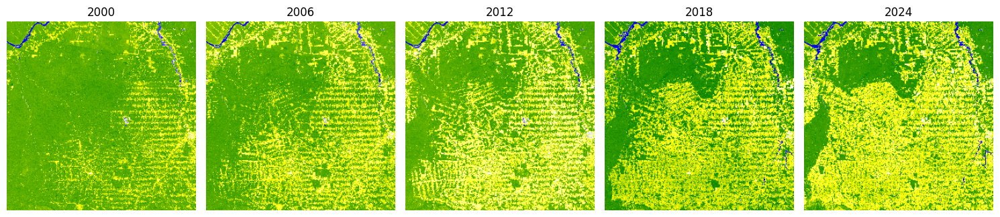

In [4]:
def plot_sample_images(images, years, step=5):
    plt.figure(figsize=(15, 5))
    for i in range(0, len(images), step):
        plt.subplot(1, len(images[::step]), i//step + 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title(str(years[i]))
        plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_sample_images(images, years, step=6)  # Show one every 6 years


In [5]:
SEQUENCE_LENGTH = 5  # You can experiment with this later

def create_time_series_data(images, sequence_length):
    X, y = [], []
    for i in range(len(images) - sequence_length):
        X.append(images[i:i+sequence_length])
        y.append(images[i+sequence_length])
    return np.array(X), np.array(y)

X, y = create_time_series_data(images, SEQUENCE_LENGTH)

print(f"Input shape (X): {X.shape}")
print(f"Target shape (y): {y.shape}")


Input shape (X): (20, 5, 256, 256, 3)
Target shape (y): (20, 256, 256, 3)


In [6]:
# Assuming you have a 'years' list that corresponds to the images
# For example:
years = [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024]

# Create time-series years data
sequence_years = [years[i:i+SEQUENCE_LENGTH] for i in range(len(years) - SEQUENCE_LENGTH)]
sequence_years = sequence_years[:len(X)]  # Align this with X after augmentations

# Now 'sequence_years' should be aligned with 'X' and ready to use
print(f"Years shape (sequence_years): {np.array(sequence_years).shape}")


Years shape (sequence_years): (20, 5)


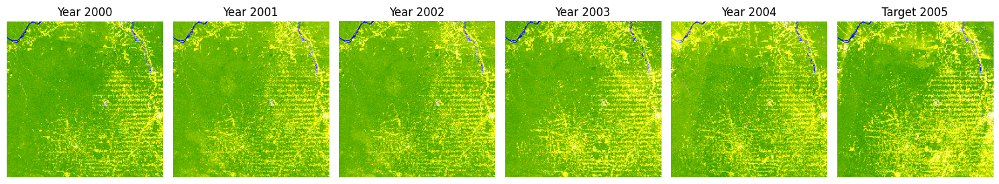

In [8]:
def plot_sequence_with_target(X, y, index=0):
    plt.figure(figsize=(15, 3))
    
    for i in range(SEQUENCE_LENGTH):
        plt.subplot(1, SEQUENCE_LENGTH + 1, i + 1)
        plt.imshow(cv2.cvtColor(X[index][i], cv2.COLOR_BGR2RGB))
        plt.title(f"Year {years[index + i]}")
        plt.axis('off')
    
    plt.subplot(1, SEQUENCE_LENGTH + 1, SEQUENCE_LENGTH + 1)
    plt.imshow(cv2.cvtColor(y[index], cv2.COLOR_BGR2RGB))
    plt.title(f"Target {years[index + SEQUENCE_LENGTH]}")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

plot_sequence_with_target(X, y)


In [10]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Conv2D, MaxPooling2D, Dense, 
                                     TimeDistributed, ConvLSTM2D, Reshape, BatchNormalization, Dropout,
                                     Flatten, UpSampling2D)
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

IMAGE_SIZE = (256, 256)
CHANNELS = 3
SEQUENCE_LENGTH = 5

# --- Loss and Metrics ---
def combined_ssim_mse_loss(y_true, y_pred):
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    ssim = tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=2.0))  # for [-1, 1] range
    return 0.1 * mse + (1 - ssim)  # SSIM is given more weight

def ssim_metric(y_true, y_pred):
    return tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=2.0))

def psnr_metric(y_true, y_pred):
    return tf.reduce_mean(tf.image.psnr(y_true, y_pred, max_val=2.0))


# --- Model Definition ---
def build_model(sequence_length, height, width, channels):
    inputs = Input(shape=(sequence_length, height, width, channels))

    # Encoder
    x = TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same'), name='conv_1')(inputs)
    x = TimeDistributed(BatchNormalization())(x)
    x = TimeDistributed(MaxPooling2D(pool_size=(2, 2)), name='pool_1')(x)
    
    x = TimeDistributed(Conv2D(64, (3, 3), activation='relu', padding='same'), name='conv_2')(x)
    x = TimeDistributed(BatchNormalization())(x)
    x = TimeDistributed(MaxPooling2D(pool_size=(2, 2)), name='pool_2')(x)

    # ConvLSTM Stack
    x = ConvLSTM2D(64, (3, 3), activation='tanh', padding='same', return_sequences=True)(x)
    x = BatchNormalization()(x)
    x = ConvLSTM2D(32, (3, 3), activation='tanh', padding='same', return_sequences=False)(x)
    x = Dropout(0.3)(x)

    # Decoder with UpSampling
    x = UpSampling2D(size=(2, 2))(x)  # Upsample to 128x128
    x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)

    x = UpSampling2D(size=(2, 2))(x)  # Upsample to 256x256
    x = Conv2D(16, (3, 3), padding='same', activation='relu')(x)

    # Output Layer
    output = Conv2D(3, (3, 3), activation='tanh', padding='same')(x)

    # Model Compile
    model = Model(inputs=inputs, outputs=output)
    model.compile(
        loss=combined_ssim_mse_loss,
        optimizer=Adam(learning_rate=0.001),
        metrics=['mae', ssim_metric, psnr_metric]
    )
    
    return model
    
model = build_model(SEQUENCE_LENGTH, IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 5, 256, 256, 3)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_1 (TimeDistributed)             │ (None, 5, 256, 256, 32)     │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 5, 256, 256, 32)     │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool_1 (TimeDistributed)             │ (None, 5, 128, 128, 32)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_2 (TimeDistributed)             │ (None, 5, 128, 128, 64)     │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_1 (TimeDistributed) │ (None, 5, 128, 128, 64)     │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool_2 (TimeDistributed)             │ (None, 5, 64, 64, 64)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d (ConvLSTM2D)             │ (None, 5, 64, 64, 64)       │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 5, 64, 64, 64)       │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_1 (ConvLSTM2D)           │ (None, 64, 64, 32)          │         110,720 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d (UpSampling2D)         │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 128, 128, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_1 (UpSampling2D)       │ (None, 256, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 256, 256, 16)        │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 256, 256, 3)         │             435 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 440,227 (1.68 MB)

 Trainable params: 439,907 (1.68 MB)

 Non-trainable params: 320 (1.25 KB)

In [11]:
# --- Data Normalization ---
X = (X - 127.5) / 127.5  # Normalize inputs to [-1, 1]
y = (y - 127.5) / 127.5  # Already normalized to [-1, 1]


In [12]:
def augment_data(X, y):
    X_aug = []
    y_aug = []

    for i in range(X.shape[0]):
        seq = X[i]
        target = y[i]

        # Random horizontal flip
        if np.random.rand() > 0.5:
            seq = np.flip(seq, axis=2)
            target = np.flip(target, axis=1)

        # Random vertical flip
        if np.random.rand() > 0.5:
            seq = np.flip(seq, axis=1)
            target = np.flip(target, axis=0)

        # Random rotation (90° steps only to avoid distortion)
        k = np.random.choice([0, 1, 2, 3])
        seq = np.rot90(seq, k=k, axes=(1, 2))
        target = np.rot90(target, k=k, axes=(0, 1))

        # Brightness jitter (small, to simulate seasonal/lighting change)
        brightness_factor = np.random.uniform(0.9, 1.1)
        seq = np.clip(seq * brightness_factor, -1.0, 1.0)
        target = np.clip(target * brightness_factor, -1.0, 1.0)

        X_aug.append(seq)
        y_aug.append(target)

    X_aug = np.array(X_aug)
    y_aug = np.array(y_aug)

    # Concatenate original and augmented data
    X_final = np.concatenate([X, X_aug])
    y_final = np.concatenate([y, y_aug])
    return X_final, y_final

AUGMENT = True
if AUGMENT:
    X_augmented, y_augmented = augment_data(X, y)


In [13]:
# Get how many times the original data was expanded by augmentation
repeat_factor = X_augmented.shape[0] // X.shape[0]

# Now tile/replicate based on the repeat_factor
sequence_years_augmented = sequence_years * repeat_factor

print("Original X shape:", X.shape)
print("Augmented X shape:", X_augmented.shape)
print("Repeat factor:", repeat_factor)
print("Augmented Years shape:", np.shape(sequence_years_augmented))  # should match X_augmented.shape[0]


Original X shape: (20, 5, 256, 256, 3)
Augmented X shape: (40, 5, 256, 256, 3)
Repeat factor: 2
Augmented Years shape: (40, 5)


In [14]:
# --- Data Split ---
from sklearn.model_selection import train_test_split

#X_train, X_test, y_train, y_test = train_test_split(X_augmented, y_augmented, test_size=0.2, random_state=42)


# Extract year sequences before splitting
sequence_years = [years[i:i+SEQUENCE_LENGTH] for i in range(len(years)-SEQUENCE_LENGTH)]

# Split both data and year sequences together (ensure aligned)
X_train, X_test, y_train, y_test, X_train_years, X_test_years = train_test_split(
    X, y, sequence_years, test_size=0.2, random_state=42
)


In [15]:
from tensorflow.keras.callbacks import EarlyStopping, LambdaCallback, ModelCheckpoint

# --- Callbacks ---
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

checkpoint_cb = ModelCheckpoint(
    filepath=os.path.join(MODEL_DIR, "best_model.h5"),
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)

def print_predictions(epoch, logs):
    sample_preds = model.predict(X_test[:1])
    print(f"\nSample prediction summary at epoch {epoch + 1}: mean={np.mean(sample_preds):.4f}, std={np.std(sample_preds):.4f}")

monitor_callback = LambdaCallback(on_epoch_end=print_predictions)

# --- Training ---
history = model.fit(
    X_train, y_train,
    epochs=120,
    batch_size=4,
    validation_split=0.2,
    callbacks=[early_stop, checkpoint_cb, monitor_callback]
)


Epoch 1/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 1.0723 - mae: 0.7267 - psnr_metric: 7.8331 - ssim_metric: -0.0057
Epoch 1: val_loss improved from inf to 1.01776, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

Sample prediction summary at epoch 1: mean=0.0762, std=0.1064
3/3 ━━━━━━━━━━━━━━━━━━━━ 38s 9s/step - loss: 1.0683 - mae: 0.7160 - psnr_metric: 7.9556 - ssim_metric: -0.0034 - val_loss: 1.0178 - val_mae: 0.6127 - val_psnr_metric: 9.2453 - val_ssim_metric: 0.0300
Epoch 2/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.9748 - mae: 0.5144 - psnr_metric: 10.4402 - ssim_metric: 0.0619
Epoch 2: val_loss improved from 1.01776 to 0.97126, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step

Sample prediction summary at epoch 2: mean=0.0936, std=0.2798
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 7s/step - loss: 0.9705 - mae: 0.5075 - psnr_metric: 10.5347 - ssim_metric: 0.0655 - val_loss: 0.9713 - val_mae: 0.5158 - val_psnr_metric: 10.5940 - val_ssim_metric: 0.0639
Epoch 3/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.8708 - mae: 0.3760 - psnr_metric: 12.2491 - ssim_metric: 0.1534
Epoch 3: val_loss improved from 0.97126 to 0.93325, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step

Sample prediction summary at epoch 3: mean=-0.0384, std=0.3769
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - loss: 0.8688 - mae: 0.3739 - psnr_metric: 12.2632 - ssim_metric: 0.1553 - val_loss: 0.9332 - val_mae: 0.4404 - val_psnr_metric: 11.5850 - val_ssim_metric: 0.0945
Epoch 4/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.8088 - mae: 0.3371 - psnr_metric: 12.4792 - ssim_metric: 0.2140
Epoch 4: val_loss improved from 0.93325 to 0.90097, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step

Sample prediction summary at epoch 4: mean=-0.1418, std=0.5210
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 7s/step - loss: 0.8086 - mae: 0.3367 - psnr_metric: 12.4741 - ssim_metric: 0.2142 - val_loss: 0.9010 - val_mae: 0.3775 - val_psnr_metric: 12.3039 - val_ssim_metric: 0.1226
Epoch 5/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 0.7840 - mae: 0.3182 - psnr_metric: 12.4616 - ssim_metric: 0.2388
Epoch 5: val_loss improved from 0.90097 to 0.88908, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step

Sample prediction summary at epoch 5: mean=-0.2465, std=0.4979
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 8s/step - loss: 0.7829 - mae: 0.3176 - psnr_metric: 12.4851 - ssim_metric: 0.2397 - val_loss: 0.8891 - val_mae: 0.3887 - val_psnr_metric: 11.9776 - val_ssim_metric: 0.1365
Epoch 6/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.7676 - mae: 0.3048 - psnr_metric: 12.8137 - ssim_metric: 0.2534
Epoch 6: val_loss improved from 0.88908 to 0.88873, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step

Sample prediction summary at epoch 6: mean=-0.3272, std=0.4951
3/3 ━━━━━━━━━━━━━━━━━━━━ 42s 7s/step - loss: 0.7670 - mae: 0.3045 - psnr_metric: 12.8139 - ssim_metric: 0.2541 - val_loss: 0.8887 - val_mae: 0.3988 - val_psnr_metric: 11.7189 - val_ssim_metric: 0.1385
Epoch 7/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.7493 - mae: 0.2843 - psnr_metric: 13.1685 - ssim_metric: 0.2701
Epoch 7: val_loss did not improve from 0.88873
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step

Sample prediction summary at epoch 7: mean=-0.4015, std=0.4837
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 6s/step - loss: 0.7489 - mae: 0.2843 - psnr_metric: 13.1683 - ssim_metric: 0.2705 - val_loss: 0.9020 - val_mae: 0.4235 - val_psnr_metric: 11.1495 - val_ssim_metric: 0.1292
Epoch 8/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.7360 - mae: 0.2754 - psnr_metric: 13.4245 - ssim_metric: 0.2825
Epoch 8: val_loss did not improve from 0.88873
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step

Sample predict

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step

Sample prediction summary at epoch 14: mean=-0.4234, std=0.5026
3/3 ━━━━━━━━━━━━━━━━━━━━ 27s 10s/step - loss: 0.6884 - mae: 0.2472 - psnr_metric: 14.0478 - ssim_metric: 0.3277 - val_loss: 0.8542 - val_mae: 0.3745 - val_psnr_metric: 11.5895 - val_ssim_metric: 0.1741
Epoch 15/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.6688 - mae: 0.2374 - psnr_metric: 14.2706 - ssim_metric: 0.3464
Epoch 15: val_loss improved from 0.85422 to 0.83903, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step

Sample prediction summary at epoch 15: mean=-0.4015, std=0.4995
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - loss: 0.6714 - mae: 0.2395 - psnr_metric: 14.2182 - ssim_metric: 0.3440 - val_loss: 0.8390 - val_mae: 0.3656 - val_psnr_metric: 11.7442 - val_ssim_metric: 0.1881
Epoch 16/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.6654 - mae: 0.2357 - psnr_metric: 14.3215 - ssim_metric: 0.3497
Epoch 16: val_loss improved from 0.83903 to 0.80490, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step

Sample prediction summary at epoch 16: mean=-0.3594, std=0.5457
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - loss: 0.6676 - mae: 0.2376 - psnr_metric: 14.2686 - ssim_metric: 0.3476 - val_loss: 0.8049 - val_mae: 0.3363 - val_psnr_metric: 12.3845 - val_ssim_metric: 0.2184
Epoch 17/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.6643 - mae: 0.2340 - psnr_metric: 14.4161 - ssim_metric: 0.3504
Epoch 17: val_loss improved from 0.80490 to 0.79662, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step

Sample prediction summary at epoch 17: mean=-0.3393, std=0.5623
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 6s/step - loss: 0.6653 - mae: 0.2361 - psnr_metric: 14.3469 - ssim_metric: 0.3496 - val_loss: 0.7966 - val_mae: 0.3310 - val_psnr_metric: 12.4530 - val_ssim_metric: 0.2262
Epoch 18/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.6573 - mae: 0.2365 - psnr_metric: 14.3105 - ssim_metric: 0.3578
Epoch 18: val_loss improved from 0.79662 to 0.77875, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step

Sample prediction summary at epoch 18: mean=-0.2780, std=0.6078
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 7s/step - loss: 0.6599 - mae: 0.2376 - psnr_metric: 14.2675 - ssim_metric: 0.3553 - val_loss: 0.7787 - val_mae: 0.3138 - val_psnr_metric: 12.8771 - val_ssim_metric: 0.2419
Epoch 19/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.6535 - mae: 0.2378 - psnr_metric: 14.2297 - ssim_metric: 0.3619
Epoch 19: val_loss improved from 0.77875 to 0.76246, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step

Sample prediction summary at epoch 19: mean=-0.2352, std=0.6379
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - loss: 0.6547 - mae: 0.2374 - psnr_metric: 14.2420 - ssim_metric: 0.3607 - val_loss: 0.7625 - val_mae: 0.3025 - val_psnr_metric: 13.1792 - val_ssim_metric: 0.2568
Epoch 20/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.6625 - mae: 0.2408 - psnr_metric: 14.1484 - ssim_metric: 0.3531
Epoch 20: val_loss improved from 0.76246 to 0.75917, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step

Sample prediction summary at epoch 20: mean=-0.2377, std=0.6213
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - loss: 0.6603 - mae: 0.2394 - psnr_metric: 14.1818 - ssim_metric: 0.3552 - val_loss: 0.7592 - val_mae: 0.3025 - val_psnr_metric: 13.1225 - val_ssim_metric: 0.2604
Epoch 21/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 0.6548 - mae: 0.2353 - psnr_metric: 14.3051 - ssim_metric: 0.3603
Epoch 21: val_loss improved from 0.75917 to 0.75547, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step

Sample prediction summary at epoch 21: mean=-0.1974, std=0.6543
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 9s/step - loss: 0.6541 - mae: 0.2355 - psnr_metric: 14.2956 - ssim_metric: 0.3610 - val_loss: 0.7555 - val_mae: 0.2969 - val_psnr_metric: 13.3211 - val_ssim_metric: 0.2632
Epoch 22/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.6488 - mae: 0.2331 - psnr_metric: 14.2835 - ssim_metric: 0.3663
Epoch 22: val_loss improved from 0.75547 to 0.74630, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step

Sample prediction summary at epoch 22: mean=-0.1939, std=0.6428
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - loss: 0.6502 - mae: 0.2341 - psnr_metric: 14.2659 - ssim_metric: 0.3650 - val_loss: 0.7463 - val_mae: 0.2937 - val_psnr_metric: 13.3603 - val_ssim_metric: 0.2722
Epoch 23/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.6491 - mae: 0.2368 - psnr_metric: 14.2697 - ssim_metric: 0.3661
Epoch 23: val_loss did not improve from 0.74630
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step

Sample prediction summary at epoch 23: mean=-0.1733, std=0.6399
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - loss: 0.6479 - mae: 0.2358 - psnr_metric: 14.2944 - ssim_metric: 0.3672 - val_loss: 0.7479 - val_mae: 0.2943 - val_psnr_metric: 13.2947 - val_ssim_metric: 0.2709
Epoch 24/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.6478 - mae: 0.2297 - psnr_metric: 14.4454 - ssim_metric: 0.3668
Epoch 24: val_loss improved from 0.74630 to 0.73555, saving model to D:\DeforestationDetectionPr

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step

Sample prediction summary at epoch 24: mean=-0.1542, std=0.6706
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 6s/step - loss: 0.6481 - mae: 0.2308 - psnr_metric: 14.4099 - ssim_metric: 0.3666 - val_loss: 0.7356 - val_mae: 0.2855 - val_psnr_metric: 13.5280 - val_ssim_metric: 0.2822
Epoch 25/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 0.6441 - mae: 0.2330 - psnr_metric: 14.2205 - ssim_metric: 0.3712
Epoch 25: val_loss improved from 0.73555 to 0.72699, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step

Sample prediction summary at epoch 25: mean=-0.1535, std=0.6654
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 8s/step - loss: 0.6453 - mae: 0.2335 - psnr_metric: 14.2246 - ssim_metric: 0.3700 - val_loss: 0.7270 - val_mae: 0.2869 - val_psnr_metric: 13.4680 - val_ssim_metric: 0.2910
Epoch 26/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.6369 - mae: 0.2345 - psnr_metric: 14.3016 - ssim_metric: 0.3783
Epoch 26: val_loss did not improve from 0.72699
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step

Sample prediction summary at epoch 26: mean=-0.1725, std=0.6418
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 7s/step - loss: 0.6396 - mae: 0.2358 - psnr_metric: 14.2632 - ssim_metric: 0.3757 - val_loss: 0.7465 - val_mae: 0.2943 - val_psnr_metric: 13.2203 - val_ssim_metric: 0.2726
Epoch 27/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.6658 - mae: 0.2459 - psnr_metric: 14.0332 - ssim_metric: 0.3503
Epoch 27: val_loss did not improve from 0.72699
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step

Sample p

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step

Sample prediction summary at epoch 29: mean=-0.1287, std=0.6625
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 6s/step - loss: 0.6274 - mae: 0.2272 - psnr_metric: 14.4530 - ssim_metric: 0.3872 - val_loss: 0.7139 - val_mae: 0.2817 - val_psnr_metric: 13.5278 - val_ssim_metric: 0.3039
Epoch 30/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.6256 - mae: 0.2302 - psnr_metric: 14.3773 - ssim_metric: 0.3892
Epoch 30: val_loss improved from 0.71394 to 0.71389, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step

Sample prediction summary at epoch 30: mean=-0.1222, std=0.6694
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 6s/step - loss: 0.6267 - mae: 0.2299 - psnr_metric: 14.3898 - ssim_metric: 0.3881 - val_loss: 0.7139 - val_mae: 0.2824 - val_psnr_metric: 13.5465 - val_ssim_metric: 0.3038
Epoch 31/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.6218 - mae: 0.2286 - psnr_metric: 14.4061 - ssim_metric: 0.3929
Epoch 31: val_loss did not improve from 0.71389
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step

Sample prediction summary at epoch 31: mean=-0.1472, std=0.6549
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 7s/step - loss: 0.6237 - mae: 0.2288 - psnr_metric: 14.4153 - ssim_metric: 0.3910 - val_loss: 0.7212 - val_mae: 0.2829 - val_psnr_metric: 13.4486 - val_ssim_metric: 0.2970
Epoch 32/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.6174 - mae: 0.2224 - psnr_metric: 14.5897 - ssim_metric: 0.3967
Epoch 32: val_loss improved from 0.71389 to 0.71041, saving model to D:\DeforestationDetectionPr

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step

Sample prediction summary at epoch 32: mean=-0.1189, std=0.6647
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 6s/step - loss: 0.6198 - mae: 0.2234 - psnr_metric: 14.5665 - ssim_metric: 0.3944 - val_loss: 0.7104 - val_mae: 0.2791 - val_psnr_metric: 13.5994 - val_ssim_metric: 0.3071
Epoch 33/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.6253 - mae: 0.2315 - psnr_metric: 14.3002 - ssim_metric: 0.3897
Epoch 33: val_loss improved from 0.71041 to 0.70576, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step

Sample prediction summary at epoch 33: mean=-0.1265, std=0.6649
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - loss: 0.6260 - mae: 0.2308 - psnr_metric: 14.3379 - ssim_metric: 0.3889 - val_loss: 0.7058 - val_mae: 0.2797 - val_psnr_metric: 13.5826 - val_ssim_metric: 0.3118
Epoch 34/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.6157 - mae: 0.2251 - psnr_metric: 14.4956 - ssim_metric: 0.3988
Epoch 34: val_loss did not improve from 0.70576
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step

Sample prediction summary at epoch 34: mean=-0.1609, std=0.6500
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - loss: 0.6206 - mae: 0.2273 - psnr_metric: 14.4435 - ssim_metric: 0.3941 - val_loss: 0.7136 - val_mae: 0.2793 - val_psnr_metric: 13.4545 - val_ssim_metric: 0.3046
Epoch 35/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.6171 - mae: 0.2279 - psnr_metric: 14.3725 - ssim_metric: 0.3976
Epoch 35: val_loss improved from 0.70576 to 0.69496, saving model to D:\DeforestationDetectionPr

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step

Sample prediction summary at epoch 35: mean=-0.1094, std=0.6787
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - loss: 0.6184 - mae: 0.2281 - psnr_metric: 14.3894 - ssim_metric: 0.3963 - val_loss: 0.6950 - val_mae: 0.2719 - val_psnr_metric: 13.6959 - val_ssim_metric: 0.3222
Epoch 36/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.6234 - mae: 0.2242 - psnr_metric: 14.6133 - ssim_metric: 0.3906
Epoch 36: val_loss did not improve from 0.69496
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step

Sample prediction summary at epoch 36: mean=-0.1260, std=0.6595
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - loss: 0.6230 - mae: 0.2248 - psnr_metric: 14.5863 - ssim_metric: 0.3911 - val_loss: 0.7004 - val_mae: 0.2768 - val_psnr_metric: 13.6183 - val_ssim_metric: 0.3170
Epoch 37/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 0.6126 - mae: 0.2278 - psnr_metric: 14.4525 - ssim_metric: 0.4019
Epoch 37: val_loss did not improve from 0.69496
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step

Sample p

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step

Sample prediction summary at epoch 38: mean=-0.1288, std=0.6697
3/3 ━━━━━━━━━━━━━━━━━━━━ 40s 7s/step - loss: 0.6161 - mae: 0.2261 - psnr_metric: 14.5134 - ssim_metric: 0.3982 - val_loss: 0.6910 - val_mae: 0.2743 - val_psnr_metric: 13.6469 - val_ssim_metric: 0.3263
Epoch 39/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.6166 - mae: 0.2273 - psnr_metric: 14.5616 - ssim_metric: 0.3976
Epoch 39: val_loss did not improve from 0.69103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step

Sample prediction summary at epoch 39: mean=-0.1632, std=0.6488
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 6s/step - loss: 0.6168 - mae: 0.2273 - psnr_metric: 14.5507 - ssim_metric: 0.3975 - val_loss: 0.7034 - val_mae: 0.2780 - val_psnr_metric: 13.5035 - val_ssim_metric: 0.3146
Epoch 40/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.5995 - mae: 0.2205 - psnr_metric: 14.6934 - ssim_metric: 0.4143
Epoch 40: val_loss improved from 0.69103 to 0.68140, saving model to D:\DeforestationDetectionPr

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step

Sample prediction summary at epoch 40: mean=-0.1062, std=0.6743
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 7s/step - loss: 0.6035 - mae: 0.2222 - psnr_metric: 14.6536 - ssim_metric: 0.4104 - val_loss: 0.6814 - val_mae: 0.2692 - val_psnr_metric: 13.7746 - val_ssim_metric: 0.3354
Epoch 41/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.6134 - mae: 0.2243 - psnr_metric: 14.7164 - ssim_metric: 0.4003
Epoch 41: val_loss did not improve from 0.68140
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step

Sample prediction summary at epoch 41: mean=-0.1181, std=0.6650
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 6s/step - loss: 0.6136 - mae: 0.2247 - psnr_metric: 14.6820 - ssim_metric: 0.4002 - val_loss: 0.6877 - val_mae: 0.2739 - val_psnr_metric: 13.6662 - val_ssim_metric: 0.3296
Epoch 42/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.6086 - mae: 0.2236 - psnr_metric: 14.6089 - ssim_metric: 0.4055
Epoch 42: val_loss did not improve from 0.68140
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step

Sample p

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step

Sample prediction summary at epoch 46: mean=-0.1022, std=0.6805
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - loss: 0.6265 - mae: 0.2347 - psnr_metric: 14.4663 - ssim_metric: 0.3880 - val_loss: 0.6676 - val_mae: 0.2658 - val_psnr_metric: 13.8449 - val_ssim_metric: 0.3490
Epoch 47/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.5996 - mae: 0.2221 - psnr_metric: 14.6831 - ssim_metric: 0.4142
Epoch 47: val_loss did not improve from 0.66759
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step

Sample prediction summary at epoch 47: mean=-0.1638, std=0.6435
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 6s/step - loss: 0.6008 - mae: 0.2222 - psnr_metric: 14.6868 - ssim_metric: 0.4129 - val_loss: 0.7008 - val_mae: 0.2776 - val_psnr_metric: 13.4528 - val_ssim_metric: 0.3174
Epoch 48/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.6232 - mae: 0.2312 - psnr_metric: 14.5113 - ssim_metric: 0.3911
Epoch 48: val_loss improved from 0.66759 to 0.65824, saving model to D:\DeforestationDetectionPr

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step

Sample prediction summary at epoch 48: mean=-0.1139, std=0.6632
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - loss: 0.6198 - mae: 0.2302 - psnr_metric: 14.5365 - ssim_metric: 0.3944 - val_loss: 0.6582 - val_mae: 0.2635 - val_psnr_metric: 13.9164 - val_ssim_metric: 0.3580
Epoch 49/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.5862 - mae: 0.2160 - psnr_metric: 14.9972 - ssim_metric: 0.4266
Epoch 49: val_loss did not improve from 0.65824
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step

Sample prediction summary at epoch 49: mean=-0.1611, std=0.6489
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - loss: 0.5884 - mae: 0.2176 - psnr_metric: 14.9390 - ssim_metric: 0.4247 - val_loss: 0.6863 - val_mae: 0.2741 - val_psnr_metric: 13.6021 - val_ssim_metric: 0.3313
Epoch 50/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - loss: 0.6019 - mae: 0.2225 - psnr_metric: 14.7835 - ssim_metric: 0.4116
Epoch 50: val_loss did not improve from 0.65824
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step

Sample p

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step

Sample prediction summary at epoch 56: mean=-0.1379, std=0.6270
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - loss: 0.5816 - mae: 0.2222 - psnr_metric: 14.9906 - ssim_metric: 0.4313 - val_loss: 0.6561 - val_mae: 0.2755 - val_psnr_metric: 13.8938 - val_ssim_metric: 0.3603
Epoch 57/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.5749 - mae: 0.2274 - psnr_metric: 14.7218 - ssim_metric: 0.4386
Epoch 57: val_loss improved from 0.65615 to 0.64575, saving model to D:\DeforestationDetectionProject\models\best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step

Sample prediction summary at epoch 57: mean=-0.1341, std=0.6564
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 7s/step - loss: 0.5767 - mae: 0.2269 - psnr_metric: 14.7544 - ssim_metric: 0.4368 - val_loss: 0.6458 - val_mae: 0.2633 - val_psnr_metric: 14.0083 - val_ssim_metric: 0.3703
Epoch 58/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.5719 - mae: 0.2198 - psnr_metric: 14.8877 - ssim_metric: 0.4413
Epoch 58: val_loss did not improve from 0.64575
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step

Sample prediction summary at epoch 58: mean=-0.1546, std=0.6331
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 6s/step - loss: 0.5753 - mae: 0.2206 - psnr_metric: 14.8710 - ssim_metric: 0.4379 - val_loss: 0.6573 - val_mae: 0.2660 - val_psnr_metric: 13.8803 - val_ssim_metric: 0.3592
Epoch 59/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.5820 - mae: 0.2219 - psnr_metric: 14.8903 - ssim_metric: 0.4311
Epoch 59: val_loss improved from 0.64575 to 0.63076, saving model to D:\DeforestationDetectionPr

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step

Sample prediction summary at epoch 59: mean=-0.1124, std=0.6414
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - loss: 0.5817 - mae: 0.2222 - psnr_metric: 14.8914 - ssim_metric: 0.4315 - val_loss: 0.6308 - val_mae: 0.2657 - val_psnr_metric: 14.1741 - val_ssim_metric: 0.3846
Epoch 60/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.5825 - mae: 0.2260 - psnr_metric: 14.8871 - ssim_metric: 0.4307
Epoch 60: val_loss did not improve from 0.63076
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step

Sample prediction summary at epoch 60: mean=-0.1896, std=0.6390
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 7s/step - loss: 0.5806 - mae: 0.2250 - psnr_metric: 14.9130 - ssim_metric: 0.4324 - val_loss: 0.6530 - val_mae: 0.2654 - val_psnr_metric: 13.9440 - val_ssim_metric: 0.3632
Epoch 61/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 0.5720 - mae: 0.2168 - psnr_metric: 14.9799 - ssim_metric: 0.4409
Epoch 61: val_loss did not improve from 0.63076
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step

Sample p

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step

Sample prediction summary at epoch 66: mean=-0.1478, std=0.6416
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 8s/step - loss: 0.5552 - mae: 0.2184 - psnr_metric: 15.0311 - ssim_metric: 0.4575 - val_loss: 0.6276 - val_mae: 0.2601 - val_psnr_metric: 14.1512 - val_ssim_metric: 0.3879
Epoch 67/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.5638 - mae: 0.2219 - psnr_metric: 15.0065 - ssim_metric: 0.4490
Epoch 67: val_loss did not improve from 0.62763
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step

Sample prediction summary at epoch 67: mean=-0.1708, std=0.6291
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 7s/step - loss: 0.5630 - mae: 0.2215 - psnr_metric: 15.0211 - ssim_metric: 0.4497 - val_loss: 0.6529 - val_mae: 0.2683 - val_psnr_metric: 13.8657 - val_ssim_metric: 0.3637
Epoch 68/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.5571 - mae: 0.2127 - psnr_metric: 15.2929 - ssim_metric: 0.4549
Epoch 68: val_loss did not improve from 0.62763
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step

Sample p

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step

Sample prediction summary at epoch 71: mean=-0.1437, std=0.6403
3/3 ━━━━━━━━━━━━━━━━━━━━ 22s 8s/step - loss: 0.5529 - mae: 0.2111 - psnr_metric: 15.3126 - ssim_metric: 0.4591 - val_loss: 0.6095 - val_mae: 0.2599 - val_psnr_metric: 14.3269 - val_ssim_metric: 0.4053
Epoch 72/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.5592 - mae: 0.2203 - psnr_metric: 15.1906 - ssim_metric: 0.4530
Epoch 72: val_loss did not improve from 0.60953
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step

Sample prediction summary at epoch 72: mean=-0.1794, std=0.6250
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 5s/step - loss: 0.5581 - mae: 0.2199 - psnr_metric: 15.1886 - ssim_metric: 0.4542 - val_loss: 0.6535 - val_mae: 0.2696 - val_psnr_metric: 13.8024 - val_ssim_metric: 0.3634
Epoch 73/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.5532 - mae: 0.2087 - psnr_metric: 15.4197 - ssim_metric: 0.4584
Epoch 73: val_loss did not improve from 0.60953
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step

Sample p

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step

Sample prediction summary at epoch 76: mean=-0.1282, std=0.6443
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 6s/step - loss: 0.5566 - mae: 0.2157 - psnr_metric: 15.1865 - ssim_metric: 0.4557 - val_loss: 0.5951 - val_mae: 0.2535 - val_psnr_metric: 14.4195 - val_ssim_metric: 0.4194
Epoch 77/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.5464 - mae: 0.2156 - psnr_metric: 15.1923 - ssim_metric: 0.4659
Epoch 77: val_loss did not improve from 0.59506
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step

Sample prediction summary at epoch 77: mean=-0.1892, std=0.6307
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - loss: 0.5469 - mae: 0.2160 - psnr_metric: 15.1899 - ssim_metric: 0.4654 - val_loss: 0.6289 - val_mae: 0.2643 - val_psnr_metric: 13.9910 - val_ssim_metric: 0.3872
Epoch 78/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.5590 - mae: 0.2234 - psnr_metric: 14.9496 - ssim_metric: 0.4539
Epoch 78: val_loss did not improve from 0.59506
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step

Sample p

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step

Sample prediction summary at epoch 80: mean=-0.1524, std=0.6409
3/3 ━━━━━━━━━━━━━━━━━━━━ 28s 8s/step - loss: 0.5429 - mae: 0.2149 - psnr_metric: 15.1876 - ssim_metric: 0.4693 - val_loss: 0.5915 - val_mae: 0.2484 - val_psnr_metric: 14.4967 - val_ssim_metric: 0.4227
Epoch 81/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.5579 - mae: 0.2225 - psnr_metric: 15.0602 - ssim_metric: 0.4547
Epoch 81: val_loss did not improve from 0.59152
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step

Sample prediction summary at epoch 81: mean=-0.1986, std=0.6240
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 7s/step - loss: 0.5556 - mae: 0.2212 - psnr_metric: 15.0850 - ssim_metric: 0.4569 - val_loss: 0.6535 - val_mae: 0.2680 - val_psnr_metric: 13.7851 - val_ssim_metric: 0.3635
Epoch 82/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.5536 - mae: 0.2149 - psnr_metric: 15.1460 - ssim_metric: 0.4587
Epoch 82: val_loss did not improve from 0.59152
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step

Sample p

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step

Sample prediction summary at epoch 88: mean=-0.1434, std=0.6372
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - loss: 0.5297 - mae: 0.2085 - psnr_metric: 15.4840 - ssim_metric: 0.4818 - val_loss: 0.5904 - val_mae: 0.2543 - val_psnr_metric: 14.3458 - val_ssim_metric: 0.4244
Epoch 89/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.5325 - mae: 0.2104 - psnr_metric: 15.4834 - ssim_metric: 0.4790
Epoch 89: val_loss did not improve from 0.59035
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step

Sample prediction summary at epoch 89: mean=-0.1833, std=0.6226
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 6s/step - loss: 0.5314 - mae: 0.2107 - psnr_metric: 15.4621 - ssim_metric: 0.4801 - val_loss: 0.6440 - val_mae: 0.2690 - val_psnr_metric: 13.7863 - val_ssim_metric: 0.3729
Epoch 90/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.5364 - mae: 0.2117 - psnr_metric: 15.4160 - ssim_metric: 0.4753
Epoch 90: val_loss did not improve from 0.59035
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step

Sample p

In [16]:
model.save(os.path.join(MODEL_DIR, "cnn_lstm_deforestation_model.h5"))

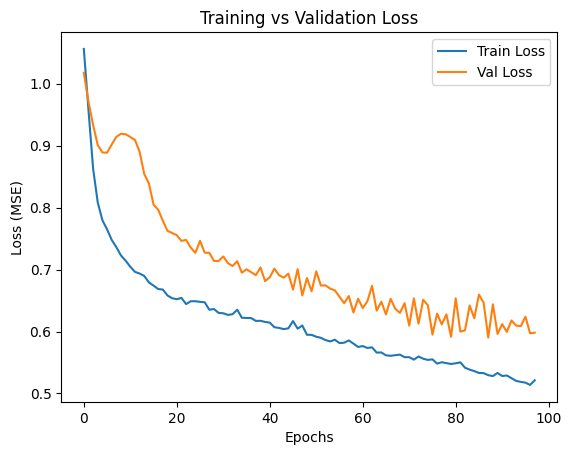

In [20]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.title("Training vs Validation Loss")
plt.show()


In [21]:
# Pick a sample from training set to warm up model
sample_sequence = X_train[0:1]  # Shape: (1, 5, 256, 256, 3)
_ = model.predict(sample_sequence)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


In [22]:
def visualize_feature_maps(model, sample_sequence, layer_names, num_features=3, time_step=0):
    from tensorflow.keras.models import Model
    import matplotlib.pyplot as plt

    # Define a model that outputs intermediate layers
    intermediate_model = Model(
        inputs=model.input,
        outputs=[model.get_layer(name).output for name in layer_names]
    )

    # Get outputs from the specified layers
    outputs = intermediate_model.predict(sample_sequence)

    for output, name in zip(outputs, layer_names):
        print(f"\nVisualizing Layer: {name}, Output shape: {output.shape}")
        
        fig, axs = plt.subplots(1, num_features, figsize=(15, 5))
        fig.suptitle(f"Feature Maps from Layer: {name}", fontsize=14)

        for i in range(num_features):
            # Decide if it's time-distributed or not
            if len(output.shape) == 5:  # (batch, time, h, w, c)
                feature_map = output[0, time_step, :, :, i]
            else:  # (batch, h, w, c)
                feature_map = output[0, :, :, i]

            axs[i].imshow(feature_map, cmap='viridis')
            axs[i].axis('off')
            axs[i].set_title(f'Feature {i}')
        plt.tight_layout()
        plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step

Visualizing Layer: pool_1, Output shape: (1, 5, 128, 128, 32)


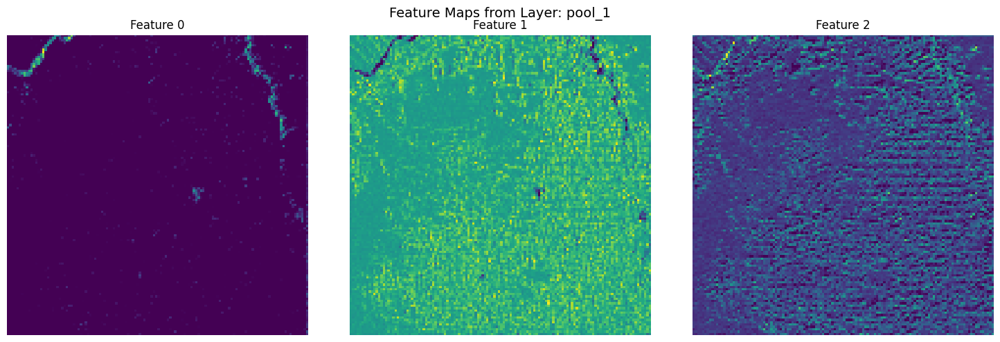


Visualizing Layer: pool_2, Output shape: (1, 5, 64, 64, 64)


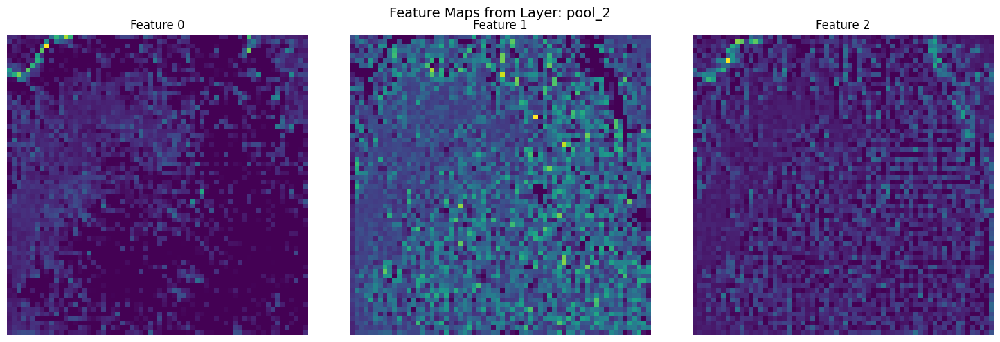

In [23]:
sample_sequence = X_train[0:1]  # shape: (1, 5, 256, 256, 3)

layer_names = ['pool_1', 'pool_2']  # or ['conv_1', 'conv_2'] if you want
visualize_feature_maps(model, sample_sequence, layer_names, num_features=3, time_step=0)


In [24]:
# Predict future images
y_pred = model.predict(X_test)

# Reshape predictions back to image format
y_pred_images = y_pred.reshape(-1, 256, 256, 3)
y_true_images = y_test.reshape(-1, 256, 256, 3)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


✅ Saved comparison plot: ..\outputs\predicted_images\prediction_vs_actual_2005.png


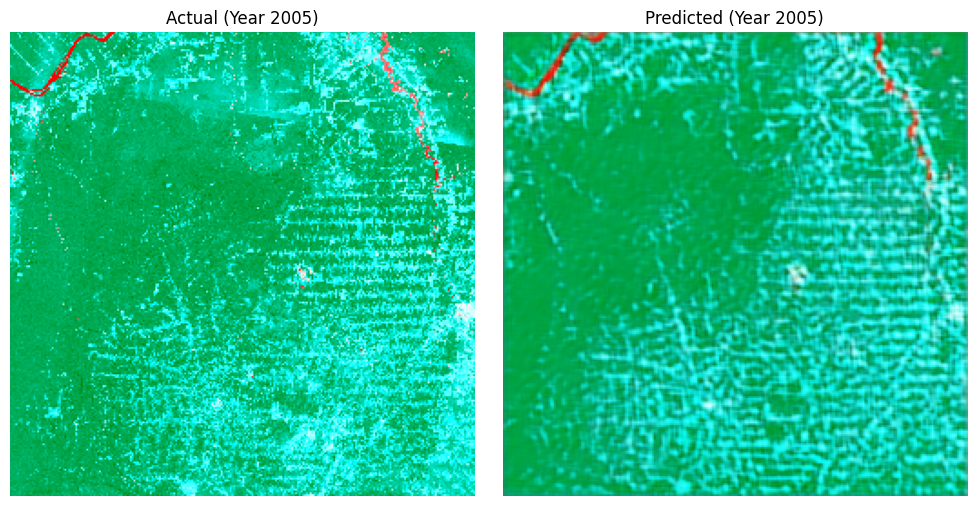

In [51]:
import os
import matplotlib.pyplot as plt

# Make sure output folder exists
BASE_OUTPUT = os.path.join("..", "outputs")
predicted_image_folder = os.path.join(BASE_OUTPUT, "predicted_images")
os.makedirs(predicted_image_folder, exist_ok=True)

def denormalize(image):
    return ((image + 1.0) / 2.0).clip(0, 1)  # Scale to [0, 1]

def show_prediction_vs_actual(y_true, y_pred, index=0, input_years=None, save=True):
    plt.figure(figsize=(10, 5))

    if input_years:
        predicted_year = input_years[index][-1] + 1
        title_pred = f"Predicted (Year {predicted_year})"
        title_true = f"Actual (Year {predicted_year})"
        filename = f"prediction_vs_actual_{predicted_year}.png"
    else:
        title_pred = "Predicted"
        title_true = "Actual"
        filename = f"prediction_vs_actual_{index}.png"

    plt.subplot(1, 2, 1)
    plt.imshow(denormalize(y_true[index]))
    plt.title(title_true)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(denormalize(y_pred[index]))
    plt.title(title_pred)
    plt.axis('off')

    plt.tight_layout()
    
    # Save the comparison image
    if save:
        save_path = os.path.join(predicted_image_folder, filename)
        plt.savefig(save_path)
        print(f"✅ Saved comparison plot: {save_path}")
    
    plt.show()


# Optional: Extract corresponding input years before splitting
sequence_years = [years[i:i+SEQUENCE_LENGTH] for i in range(len(years)-SEQUENCE_LENGTH)]
_, X_test_years = train_test_split(sequence_years, test_size=0.2, random_state=42)

# Show prediction
show_prediction_vs_actual(y_true_images, y_pred_images, index=0, input_years=X_test_years)

In [52]:
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

def evaluate_predictions(y_true_images, y_pred_images):
    total_ssim = 0
    total_psnr = 0
    total_samples = len(y_true_images)

    for i in range(total_samples):
        true_img = y_true_images[i]
        pred_img = y_pred_images[i]

        # Pass data_range=1.0 since images are normalized
        ssim_score = ssim(true_img, pred_img, channel_axis=2, data_range=1.0)
        psnr_score = psnr(true_img, pred_img, data_range=1.0)

        total_ssim += ssim_score
        total_psnr += psnr_score

    avg_ssim = total_ssim / total_samples
    avg_psnr = total_psnr / total_samples

    print(f"Average SSIM: {avg_ssim:.4f}")
    print(f"Average PSNR: {avg_psnr:.2f} dB")

y_pred_images = np.clip(y_pred_images, -1.0, 1.0)
evaluate_predictions(y_true_images, y_pred_images)


Average SSIM: 0.3925
Average PSNR: 9.20 dB


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


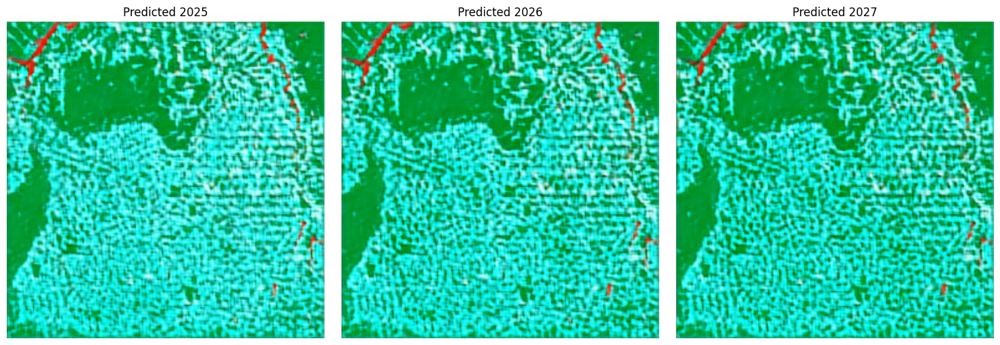

In [53]:
def predict_future_ndvi(model, initial_sequence, num_future_years=3):
    """
    Predicts future NDVI maps using a rolling window of CNN-LSTM.
    :param model: trained model
    :param initial_sequence: numpy array of shape (5, 256, 256, 3)
    :param num_future_years: number of years to predict
    :return: list of predicted NDVI images
    """
    predictions = []
    current_sequence = initial_sequence.copy()

    for _ in range(num_future_years):
        input_seq = current_sequence[np.newaxis, ...]  # shape: (1, 5, 256, 256, 3)
        pred_image = model.predict(input_seq)[0]  # shape: (256, 256, 3)
        pred_image = np.clip(pred_image, -1.0, 1.0)  # Ensure in valid range
        predictions.append(pred_image)

        # Update sequence
        current_sequence = np.concatenate((current_sequence[1:], pred_image[np.newaxis, ...]), axis=0)

    return predictions


# Use last sequence from training/whole set (2020–2024 assumed)
last_sequence = X[-1]  # shape: (5, 256, 256, 3)
future_predictions = predict_future_ndvi(model, last_sequence, num_future_years=3)

# Future years
future_years = [2025, 2026, 2027]

# Plotting
plt.figure(figsize=(15, 5))
for i, img in enumerate(future_predictions):
    plt.subplot(1, len(future_predictions), i+1)
    plt.imshow(denormalize(img))  # if normalized to [-1, 1]
    plt.title(f"Predicted {future_years[i]}")
    plt.axis('off')
plt.tight_layout()
plt.show()


In [57]:
# Define where to save predicted NDVI .npy files
predicted_image_folder = os.path.join(BASE_OUTPUT, "predicted_images")
os.makedirs(predicted_image_folder, exist_ok=True)


# Save each predicted image
for i, pred_image in enumerate(future_predictions):
    year = future_years[i]

    # Save .npy for processing
    npy_path = os.path.join(predicted_image_folder, f"ndvi_{year}.npy")
    np.save(npy_path, pred_image)

    # Save .png for visualization
    png_path = os.path.join(predicted_image_folder, f"ndvi_{year}.png")
    plt.imsave(png_path, denormalize(pred_image), cmap='viridis')

print(f"✅ Saved predicted .npy and .png files in '{predicted_image_folder}'")

ndvi_2024 = last_sequence[-1]  # Extract NDVI image for 2024

# Save path
output_folder = os.path.join("..", "outputs", "predicted_images")
os.makedirs(output_folder, exist_ok=True)

# Save NDVI for 2024
np.save(os.path.join(output_folder, "ndvi_2024.npy"), ndvi_2024)

print("✅ NDVI file for 2024 saved successfully!")

✅ Saved predicted .npy and .png files in '..\outputs\predicted_images'
✅ NDVI file for 2024 saved successfully!


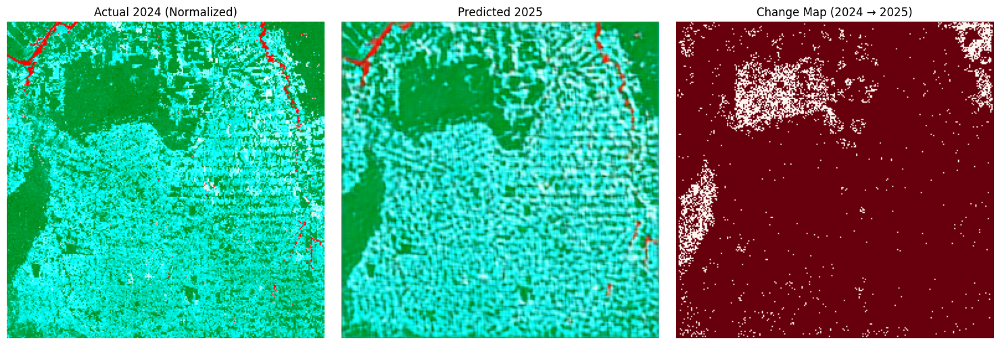

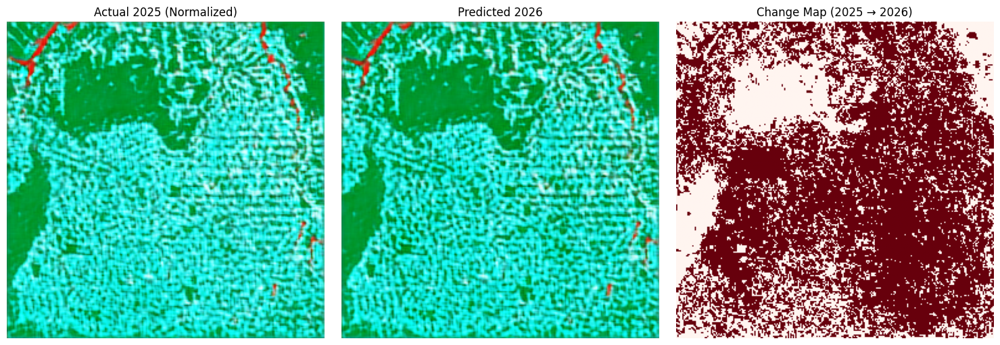

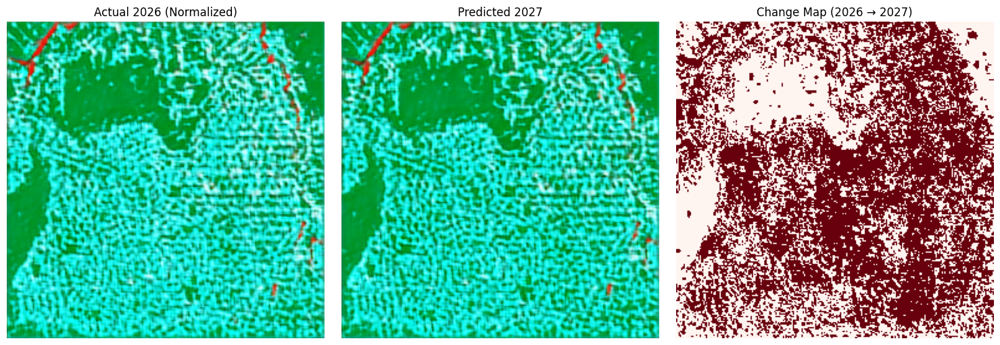

✅ All change maps saved in '..\outputs\predicted_changemaps' successfully!


In [71]:
import os
import numpy as np
import matplotlib.pyplot as plt

def compute_change_map(image1, image2, threshold=0.1):
    """
    Compute binary change map between two NDVI images.
    Highlights pixels where the mean channel-wise difference exceeds threshold.
    """
    diff = np.abs(image2 - image1)
    mask = np.mean(diff, axis=2) > threshold
    return mask

# Define project-level output directory (one level up from notebooks)
OUTPUT_DIR = os.path.join("..", "outputs", "predicted_changemaps")
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Get the last known NDVI (2024)
previous_ndvi = X[-1][-1]
previous_ndvi = (previous_ndvi - previous_ndvi.min()) / (previous_ndvi.max() - previous_ndvi.min() + 1e-8)

future_years = [2025, 2026, 2027]

for i, year in enumerate(future_years):
    predicted_ndvi = future_predictions[i]
    predicted_ndvi = (predicted_ndvi - predicted_ndvi.min()) / (predicted_ndvi.max() - predicted_ndvi.min() + 1e-8)

    # Compute change map
    change_map = compute_change_map(previous_ndvi, predicted_ndvi, threshold=0.02)

    # Plot results
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(previous_ndvi, cmap='viridis')
    plt.title(f"Actual {future_years[i - 1] if i > 0 else 2024} (Normalized)")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(predicted_ndvi, cmap='viridis')
    plt.title(f"Predicted {year}")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(change_map, cmap='Reds')  # or 'hot'
    plt.title(f"Change Map ({future_years[i - 1] if i > 0 else 2024} → {year})")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Save change map to output/predicted_images
    save_path = os.path.join(OUTPUT_DIR, f"change_map_{future_years[i - 1] if i > 0 else 2024}_to_{year}.png")
    plt.imsave(save_path, change_map.astype(float), cmap='Reds')

    previous_ndvi = predicted_ndvi.copy()

print(f"✅ All change maps saved in '{OUTPUT_DIR}' successfully!")


Processing file: change_map_2024_to_2025.png for year 2025
Processing file: change_map_2025_to_2026.png for year 2026
Processing file: change_map_2026_to_2027.png for year 2027


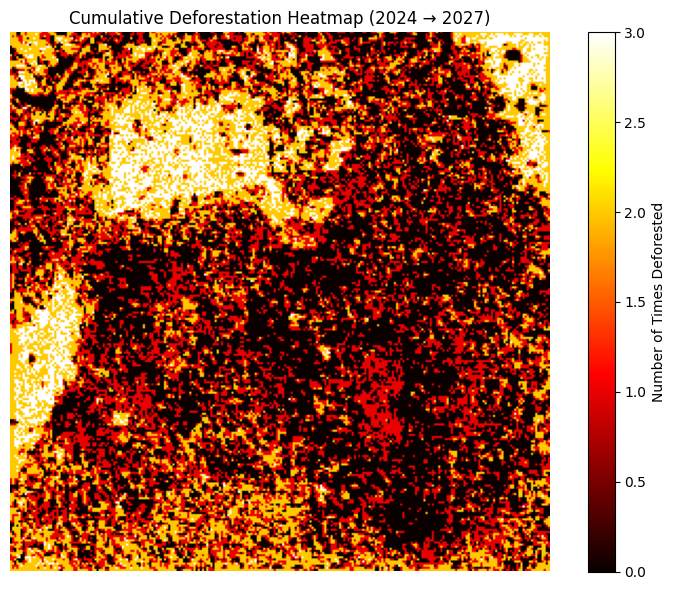

In [72]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from PIL import Image

# --- SETTINGS (inside 'output' folder of the project) ---
BASE_OUTPUT = os.path.join("..", "outputs")

change_map_folder = os.path.join(BASE_OUTPUT, "predicted_changemaps")
predicted_image_folder = os.path.join(BASE_OUTPUT, "predicted_images")  # NEW location for NDVI .npy files
signed_diff_folder = os.path.join(BASE_OUTPUT, "signed_diff_maps")
weighted_change_folder = os.path.join(BASE_OUTPUT, "weighted_change_maps")
classified_map_folder = os.path.join(BASE_OUTPUT, "classified_change_maps")

os.makedirs(signed_diff_folder, exist_ok=True)
os.makedirs(weighted_change_folder, exist_ok=True)
os.makedirs(classified_map_folder, exist_ok=True)

# Sorted list of change map filenames
change_map_files = sorted([
    f for f in os.listdir(change_map_folder)
    if f.endswith(".png") and "change_map" in f
])

# Initialize maps
cumulative_change = None
signed_diff = None
weighted_change = None

# Updated function to load NDVI predictions from predicted_images folder
def load_ndvi_prediction(year):
    path = os.path.join(predicted_image_folder, f"ndvi_{year}.npy")
    if not os.path.exists(path):
        print(f"NDVI file for {year} not found at {path}")
    return np.load(path) if os.path.exists(path) else None

# Start from 2024 (the last known year of input)
previous_ndvi = load_ndvi_prediction(2024)

for i, file in enumerate(change_map_files):
    year = 2025 + i
    print(f"Processing file: {file} for year {year}")
    next_ndvi = load_ndvi_prediction(year)

    # Binary Change Map
    path = os.path.join(change_map_folder, file)
    img = Image.open(path).convert("L")
    binary_map = np.array(img) > 128

    # Cumulative Change Map
    if cumulative_change is None:
        cumulative_change = np.zeros_like(binary_map, dtype=int)
    cumulative_change += binary_map.astype(int)

    # Signed Difference and Weighted Change Logic
    if previous_ndvi is not None and next_ndvi is not None:
        signed = next_ndvi - previous_ndvi
        signed_avg = np.mean(signed, axis=2)

        signed_diff = signed_avg if signed_diff is None else signed_diff + signed_avg
        np.save(os.path.join(signed_diff_folder, f"signed_diff_{year}.npy"), signed_avg)

        weighted = np.abs(signed_avg) * binary_map
        weighted_change = weighted if weighted_change is None else weighted_change + weighted
        np.save(os.path.join(weighted_change_folder, f"weighted_change_{year}.npy"), weighted)

    else:
        print(f"Skipping year {year} due to missing NDVI data.")

    previous_ndvi = next_ndvi

# --- Save and Plot Heatmaps ---
if cumulative_change is not None:
    plt.figure(figsize=(8, 6))
    plt.imshow(cumulative_change, cmap='hot')
    plt.colorbar(label="Number of Times Deforested")
    plt.title("Cumulative Deforestation Heatmap (2024 → 2027)")
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(change_map_folder, "cumulative_deforestation_heatmap.png"))
    plt.show()


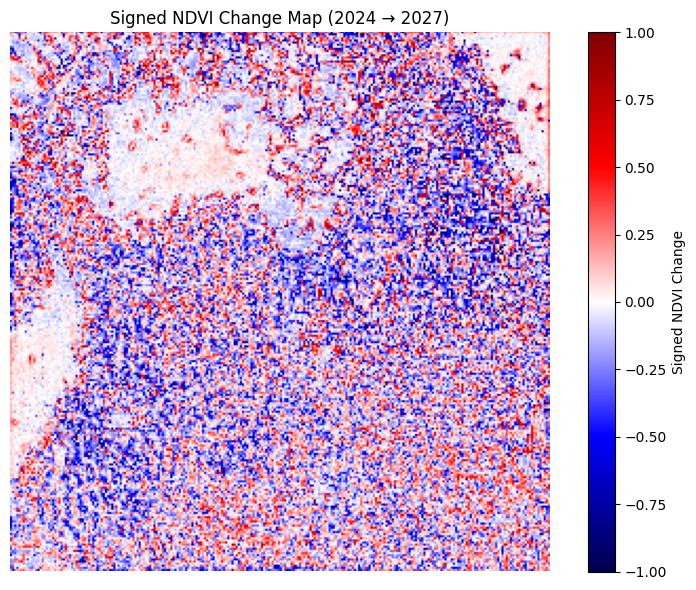

In [73]:
if signed_diff is not None:
    plt.figure(figsize=(8, 6))
    plt.imshow(signed_diff, cmap='seismic', norm=Normalize(vmin=-1, vmax=1))
    plt.colorbar(label="Signed NDVI Change")
    plt.title("Signed NDVI Change Map (2024 → 2027)")
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(signed_diff_folder, "signed_diff_heatmap.png"))
    plt.show()


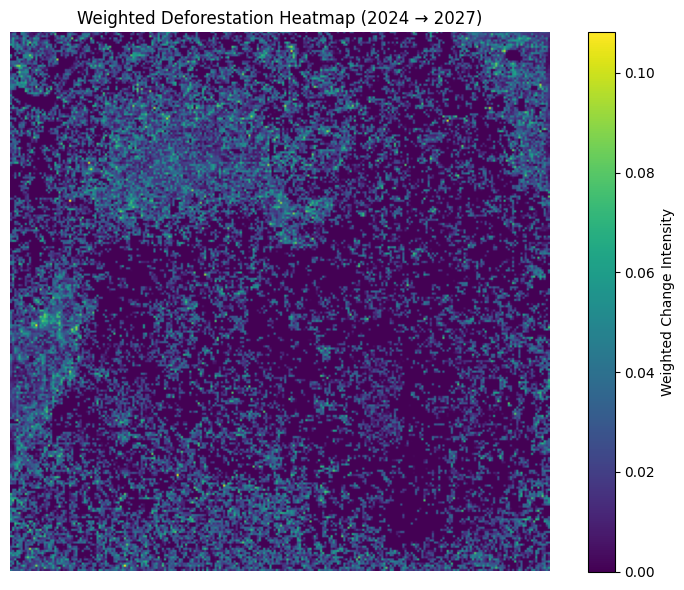

In [74]:
if weighted_change is not None:
    plt.figure(figsize=(8, 6))
    plt.imshow(weighted_change, cmap='viridis')
    plt.colorbar(label="Weighted Change Intensity")
    plt.title("Weighted Deforestation Heatmap (2024 → 2027)")
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(weighted_change_folder, "weighted_change_heatmap.png"))
    plt.show()

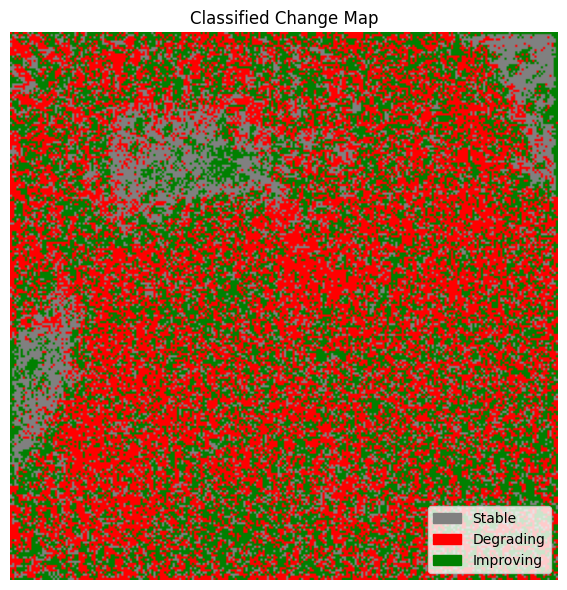

✅ All maps and heatmaps saved successfully!


In [75]:
#--- Classification Map ---
if signed_diff is not None:
    classified_map = np.zeros_like(signed_diff, dtype=np.uint8)
    classified_map[signed_diff > 0.05] = 2     # Improving
    classified_map[signed_diff < -0.05] = 1    # Degrading

    colors = ['gray', 'red', 'green']
    cmap = plt.matplotlib.colors.ListedColormap(colors)
    plt.figure(figsize=(8, 6))
    plt.imshow(classified_map, cmap=cmap, vmin=0, vmax=2)
    plt.title("Classified Change Map")
    labels = ["Stable", "Degrading", "Improving"]
    patches = [plt.matplotlib.patches.Patch(color=colors[i], label=labels[i]) for i in range(3)]
    plt.legend(handles=patches, loc='lower right')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(classified_map_folder, "classified_change_map.png"))
    plt.show()

print(f"✅ All maps and heatmaps saved successfully!")


In [76]:
import csv
import os
import numpy as np

# Folder where you want to save the CSV
report_csv_path = os.path.join("..", "outputs", "predicted_changemaps", "change_summary_report.csv")

# Initialize previous NDVI
previous_ndvi = X[-1][-1]
previous_ndvi = (previous_ndvi - previous_ndvi.min()) / (previous_ndvi.max() - previous_ndvi.min() + 1e-8)

future_years = [2025, 2026, 2027]
threshold = 0.02  # Change threshold

# Create CSV file and write header
with open(report_csv_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Year", "Degraded Pixels", "Improved Pixels", "Stable Pixels"])

    for i, year in enumerate(future_years):
        predicted_ndvi = future_predictions[i]
        predicted_ndvi = (predicted_ndvi - predicted_ndvi.min()) / (predicted_ndvi.max() - predicted_ndvi.min() + 1e-8)

        # Compute signed difference
        diff = predicted_ndvi - previous_ndvi
        diff_mean = np.mean(diff, axis=2)  # mean across channels

        degraded = np.sum(diff_mean <= -threshold)
        improved = np.sum(diff_mean >= threshold)
        stable = np.sum((diff_mean > -threshold) & (diff_mean < threshold))

        # Write row to CSV
        writer.writerow([year, degraded, improved, stable])

        # Update for next iteration
        previous_ndvi = predicted_ndvi.copy()

print(f"✅ CSV report saved to: {report_csv_path}")


✅ CSV report saved to: ..\outputs\predicted_changemaps\change_summary_report.csv


Total Years Loaded: 25


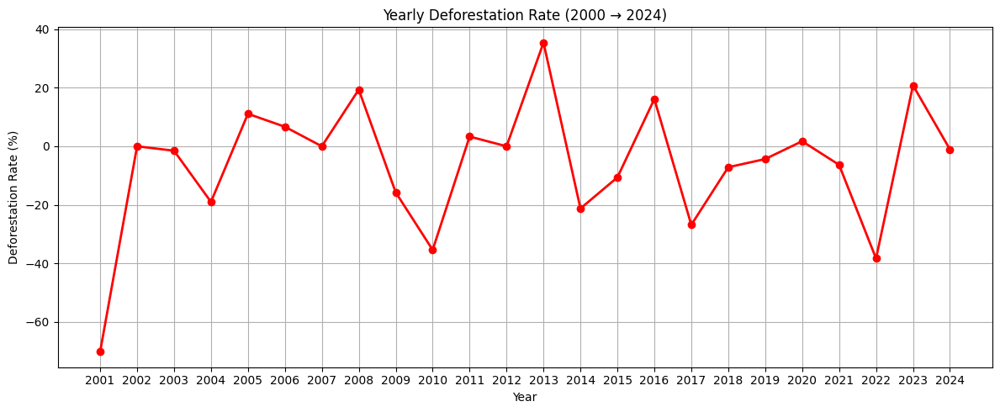

✅ Deforestation Rate Graph saved successfully!


In [81]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from glob import glob

# --- SETTINGS ---
BASE_DIR = os.path.abspath("..")
DATA_DIR = os.path.join(BASE_DIR, "data", "raw_images")
OUTPUT_DIR = os.path.join(BASE_DIR, "outputs", "original_images_files")

# Step 1: Load Images in Time Series Order
def load_images(folder_path):
    image_paths = sorted(glob(os.path.join(folder_path, "*.png")))
    images = []
    years = []
    
    for path in image_paths:
        try:
            year = int(os.path.basename(path).split('_')[-1].split('.')[0])
            img = cv2.imread(path)
            img = cv2.resize(img, (256, 256))  # Resize images to 256x256 (or your preferred size)
            images.append(img)
            years.append(year)
        except:
            continue
    return np.array(images), years

images, years = load_images(DATA_DIR)

print(f"Total Years Loaded: {len(images)}")

# Step 2: Count Green Pixels in NDVI Image
def count_green_pixels(ndvi_image, green_threshold=0.4):
    """
    Count green pixels in an NDVI image.
    Assumes image shape (256, 256, 3) and uses the mean NDVI across channels.
    """
    avg_ndvi = np.mean(ndvi_image, axis=2)
    green_pixels = (avg_ndvi > green_threshold).sum()
    return green_pixels

# Step 3: Normalize and Count Green Pixels Year-wise
normalized_images = []
for img in images:
    img = (img - img.min()) / (img.max() - img.min() + 1e-8)  # Normalize NDVI images
    normalized_images.append(img)

# Count green pixels year-wise
green_counts = [count_green_pixels(img) for img in normalized_images]

# Step 4: Calculate Deforestation Rate (percentage loss)
deforestation_rates = []
for i in range(1, len(green_counts)):
    change = green_counts[i-1] - green_counts[i]
    percent_loss = (change / green_counts[i-1]) * 100
    deforestation_rates.append(percent_loss)

# Step 5: Plot the Deforestation Rate from 2000 to 2024
plt.figure(figsize=(12, 5))
plt.plot(years[1:], deforestation_rates, marker='o', color='red', linewidth=2)
plt.title("Yearly Deforestation Rate (2000 → 2024)")
plt.xlabel("Year")
plt.ylabel("Deforestation Rate (%)")
plt.grid(True)
plt.xticks(years[1:])
plt.tight_layout()

# Save the graph in the output folder
os.makedirs(OUTPUT_DIR, exist_ok=True)
plt.savefig(os.path.join(OUTPUT_DIR, "deforestation_rate_2000_to_2024.png"))
plt.show()

print(f"✅ Deforestation Rate Graph saved successfully!")


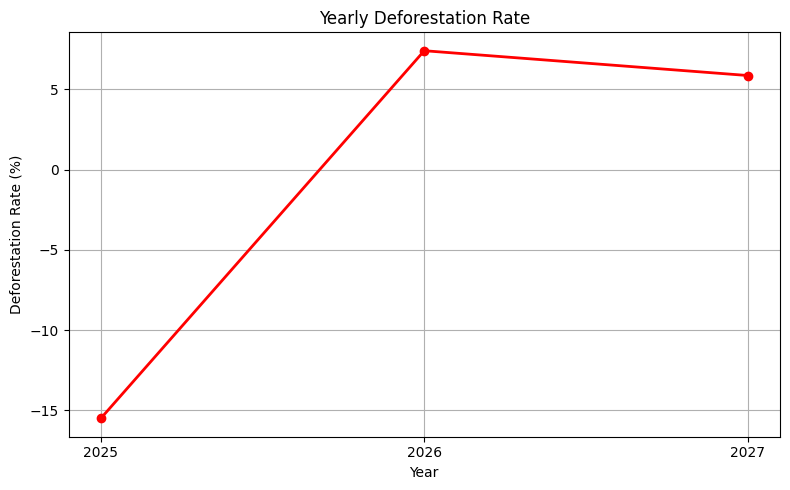

In [77]:
import numpy as np
import matplotlib.pyplot as plt

# Count green pixels in an NDVI image
def count_green_pixels(ndvi_image, green_threshold=0.4):
    """
    Count green pixels in an NDVI image.
    Assumes image shape (256, 256, 3) and uses the mean NDVI across channels.
    """
    avg_ndvi = np.mean(ndvi_image, axis=2)
    green_pixels = (avg_ndvi > green_threshold).sum()
    return green_pixels

# Years and images (true NDVI for 2024 and predicted for 2025, 2026, 2027)
all_years = [2024, 2025, 2026, 2027]
all_ndvi_images = [X[-1][-1]] + future_predictions  # Assuming 'future_predictions' is already generated

# Normalize all NDVI images
normalized_images = []
for img in all_ndvi_images:
    img = (img - img.min()) / (img.max() - img.min() + 1e-8)  # Normalize each image to range [0, 1]
    normalized_images.append(img)

# Count green pixels year-wise
green_counts = [count_green_pixels(img) for img in normalized_images]

# Calculate percentage change year-over-year (deforestation rate)
deforestation_rates = []
for i in range(1, len(green_counts)):
    change = green_counts[i-1] - green_counts[i]
    percent_loss = (change / green_counts[i-1]) * 100
    deforestation_rates.append(percent_loss)

# Plot Deforestation Rate Graph
plt.figure(figsize=(8, 5))
plt.plot(all_years[1:], deforestation_rates, marker='o', color='red', linewidth=2)
plt.title("Yearly Deforestation Rate")
plt.xlabel("Year")
plt.ylabel("Deforestation Rate (%)")
plt.grid(True)
plt.xticks(all_years[1:])
plt.tight_layout()
plt.show()
